### Import necessary packages

In [2]:
import pandas as pd
pd.options.mode.chained_assignment = None 
import numpy as np
import re
import nltk
import seaborn as sns
from tqdm import tqdm
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

### Unpickling file and Loading data

In [3]:
import pickle
pickle_file = open("RQ3_Input_Dataset1.data",'rb')
#pickle_file = open("C:\\Users\\snigd\\RQ3_Input_Dataset1.data",'rb')

##RQ3_Input_Dataset1.data
##RQ3_Input_Dataset2.data

pickle_data = pickle.load(pickle_file)
df = pd.DataFrame(pickle_data)

### Required data cleaning

In [4]:
pd.set_option('display.max_columns', None)

df['RvScoreWorkAtmosphere'] = df['RvScoreWorkAtmosphere'].round(0)

df['RvScoreCohesionAmongColleagues'] = df['RvScoreCohesionAmongColleagues'].round(0)

df['RvScoreEqualRights'] = df['RvScoreEqualRights'].round(0)

df['RvScoreDealingWithOlderColleagues'] = df['RvScoreDealingWithOlderColleagues'].round(0)

df['RvScoreEnvironmentalSocialAwareness'] = df['RvScoreEnvironmentalSocialAwareness'].round(0)

df['RvScoreWorkLifeBalance'] = df['RvScoreWorkLifeBalance'].round(0)


### Data Slicing as per Industry sector

In [5]:
conditions = [(df["OrgSector"] == 'Immobilien'),
              (df["OrgSector"] == 'Elektro/Elektronik'),
              (df["OrgSector"] == 'Sonstige Branchen'),
              (df["OrgSector"] == 'Maschinenbau'),
              (df["OrgSector"] == 'Handel'),
              (df["OrgSector"] == 'Internet'),
              (df["OrgSector"] == 'Medizin/Pharma'),
              (df["OrgSector"] == 'IT'),
              (df["OrgSector"] == 'Automobil'),
              (df["OrgSector"] == 'Industrie'),
              (df["OrgSector"] == 'Dienstleistung'),
              (df["OrgSector"] == 'Energie'),
              (df["OrgSector"] == 'Marketing/Werbung/PR'),
              (df["OrgSector"] == 'Nahrungsmittel/Landwirtschaft'),              
              (df["OrgSector"] == 'Chemie'),
              (df["OrgSector"] == 'Finanz'),
              (df["OrgSector"] == 'Banken'),
              (df["OrgSector"] == 'Transport/Verkehr/Logistik'),
              (df["OrgSector"] == 'Telekommunikation'),
              (df["OrgSector"] == 'Bau/Architektur'),
              (df["OrgSector"] == 'Versicherung'),
              (df["OrgSector"] == 'Kunst/Kultur'),
              (df["OrgSector"] == 'Textil'),
              (df["OrgSector"] == ' Immobilien'),
              (df["OrgSector"] == 'Medien'),
              (df["OrgSector"] == 'Personalwesen & -beschaffung'),
              (df["OrgSector"] == ' Industrie'),
              (df["OrgSector"] == 'Sport/Beauty'),
              (df["OrgSector"] == 'Druck/Verpackung'),
              (df["OrgSector"] == 'Medizintechnik'),
              (df["OrgSector"] == 'Forschung/Entwicklung'),
              (df["OrgSector"] == 'Beratung/Consulting')
              ]
choices_NewOrgSector = ['Finance, Insurance, Real Estate', 'Manufacturing', 'Others', 'Manufacturing', 'Retail Trade',
                        'Services','Manufacturing','Manufacturing','Manufacturing','Manufacturing','Services',
                        'Transportation & Public Utilities','Services','Agriculture, Forestry, Fishing','Manufacturing',
                        'Finance, Insurance, Real Estate','Finance, Insurance, Real Estate',
                        'Transportation & Public Utilities',
                        'Transportation & Public Utilities','Construction','Finance, Insurance, Real Estate','Services',
                        'Manufacturing','Finance, Insurance, Real Estate','Services','Services','Manufacturing',
                        'Services','Manufacturing','Manufacturing','Services','Services']
df["NewOrgSector"] = np.select(conditions, choices_NewOrgSector, default='NaN')

### Normalising Sentiment Score

In [6]:
conditions = [
    (df['score101'] > 0), (df['score101'] < 0), (df['score101'] ==0)]
choices = ['Positive', 'Negative', 'Neutral']
df['ForTSNEScore101'] = np.select(conditions, choices, default='NaN')

In [7]:
# Checking no. of reviews in each Industry sector
df['NewOrgSector'].value_counts()

Manufacturing                        11091
Transportation & Public Utilities     3221
Services                              2808
Finance, Insurance, Real Estate       2514
Retail Trade                          1044
Others                                 153
Construction                            94
Agriculture, Forestry, Fishing          72
Name: NewOrgSector, dtype: int64

### Plotting TSNE PLOTS for each industry sector

Tsne_Model for Manufacturing
[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 11091 samples in 0.121s...
[t-SNE] Computed neighbors for 11091 samples in 10.797s...
[t-SNE] Computed conditional probabilities for sample 1000 / 11091
[t-SNE] Computed conditional probabilities for sample 2000 / 11091
[t-SNE] Computed conditional probabilities for sample 3000 / 11091
[t-SNE] Computed conditional probabilities for sample 4000 / 11091
[t-SNE] Computed conditional probabilities for sample 5000 / 11091
[t-SNE] Computed conditional probabilities for sample 6000 / 11091
[t-SNE] Computed conditional probabilities for sample 7000 / 11091
[t-SNE] Computed conditional probabilities for sample 8000 / 11091
[t-SNE] Computed conditional probabilities for sample 9000 / 11091
[t-SNE] Computed conditional probabilities for sample 10000 / 11091
[t-SNE] Computed conditional probabilities for sample 11000 / 11091
[t-SNE] Computed conditional probabilities for sample 11091 / 11091
[t-SNE] Mean sigma:

<ipython-input-8-2a8f9d6b2558>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))


Tsne_Model for Services
[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 2808 samples in 0.022s...
[t-SNE] Computed neighbors for 2808 samples in 1.179s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2808
[t-SNE] Computed conditional probabilities for sample 2000 / 2808
[t-SNE] Computed conditional probabilities for sample 2808 / 2808
[t-SNE] Mean sigma: 0.000095
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.894485
[t-SNE] KL divergence after 2000 iterations: 1.265997


<ipython-input-8-2a8f9d6b2558>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))


Tsne_Model for Finance
[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 2514 samples in 0.020s...
[t-SNE] Computed neighbors for 2514 samples in 0.900s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2514
[t-SNE] Computed conditional probabilities for sample 2000 / 2514
[t-SNE] Computed conditional probabilities for sample 2514 / 2514
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.449142
[t-SNE] KL divergence after 2000 iterations: 1.143779


<ipython-input-8-2a8f9d6b2558>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))


Tsne_Model for Retail
[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 1044 samples in 0.007s...
[t-SNE] Computed neighbors for 1044 samples in 0.207s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1044
[t-SNE] Computed conditional probabilities for sample 1044 / 1044
[t-SNE] Mean sigma: 0.168831
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.188972
[t-SNE] KL divergence after 2000 iterations: 0.899202


<ipython-input-8-2a8f9d6b2558>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))


Tsne_Model for Others
[t-SNE] Computing 152 nearest neighbors...
[t-SNE] Indexed 153 samples in 0.000s...
[t-SNE] Computed neighbors for 153 samples in 0.133s...
[t-SNE] Computed conditional probabilities for sample 153 / 153
[t-SNE] Mean sigma: 0.280315
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.243958
[t-SNE] KL divergence after 1350 iterations: 0.466889


<ipython-input-8-2a8f9d6b2558>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))


Tsne_Model for Construction
[t-SNE] Computing 93 nearest neighbors...
[t-SNE] Indexed 94 samples in 0.000s...
[t-SNE] Computed neighbors for 94 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 94 / 94
[t-SNE] Mean sigma: 0.357967
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.434952
[t-SNE] KL divergence after 2000 iterations: 0.515141


<ipython-input-8-2a8f9d6b2558>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))


Tsne_Model for Agriculture
[t-SNE] Computing 71 nearest neighbors...
[t-SNE] Indexed 72 samples in 0.001s...
[t-SNE] Computed neighbors for 72 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 72 / 72
[t-SNE] Mean sigma: 0.776685
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.239773
[t-SNE] KL divergence after 2000 iterations: 0.616213


<ipython-input-8-2a8f9d6b2558>:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,10))


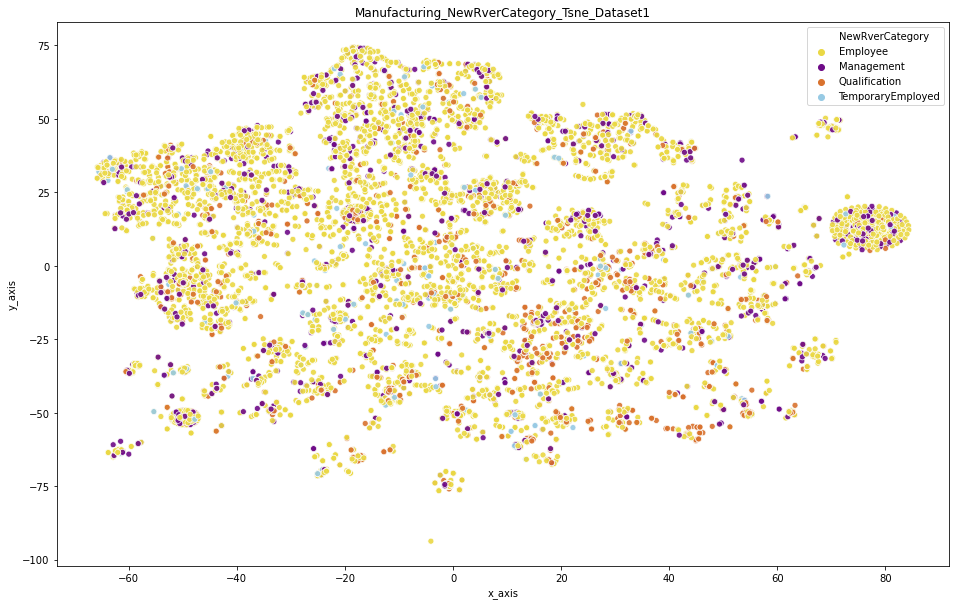

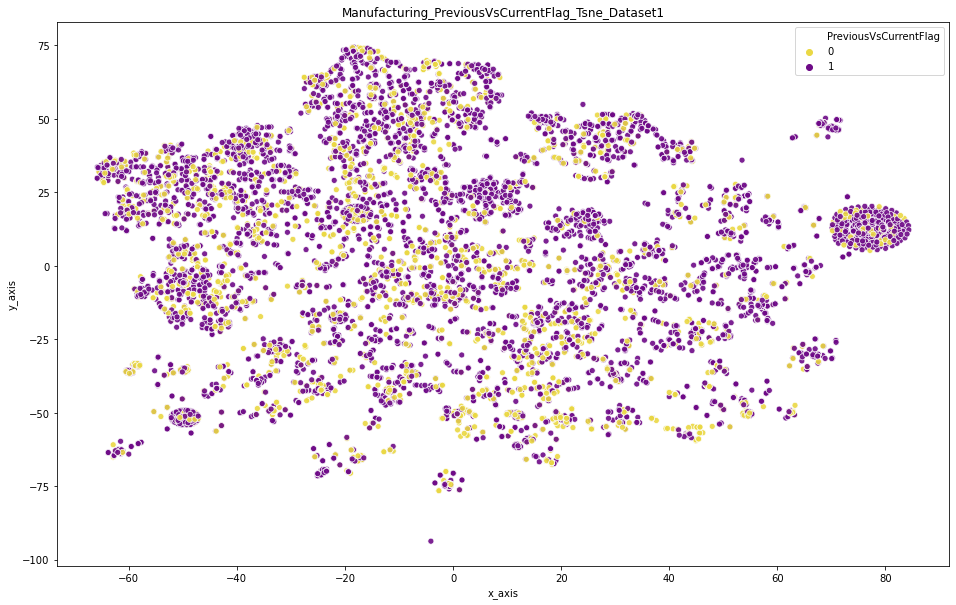

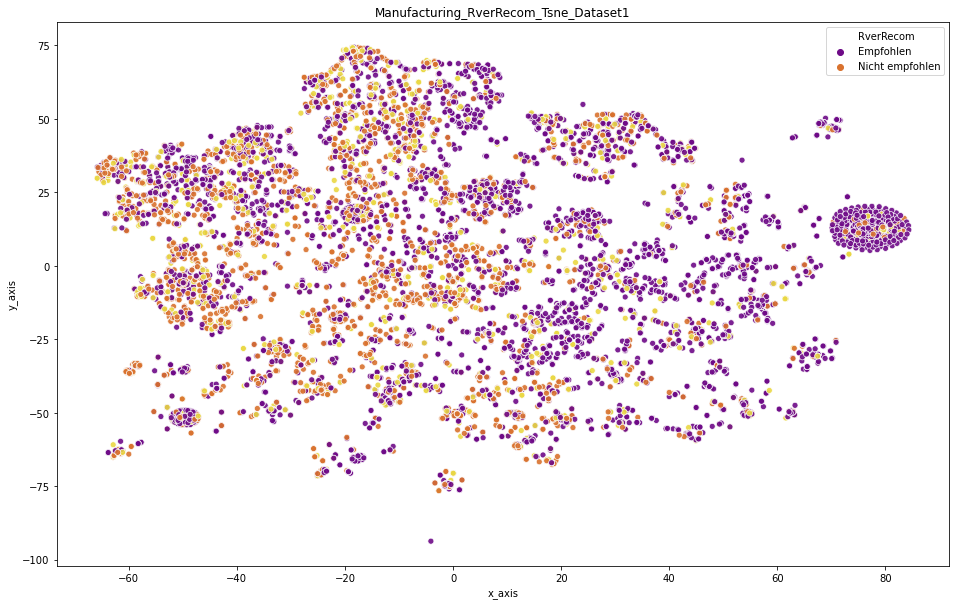

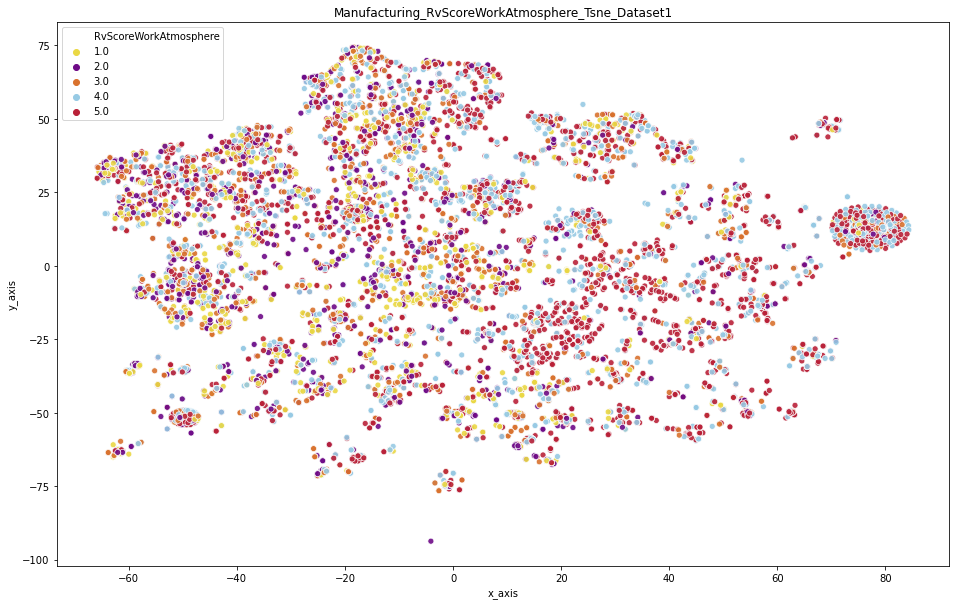

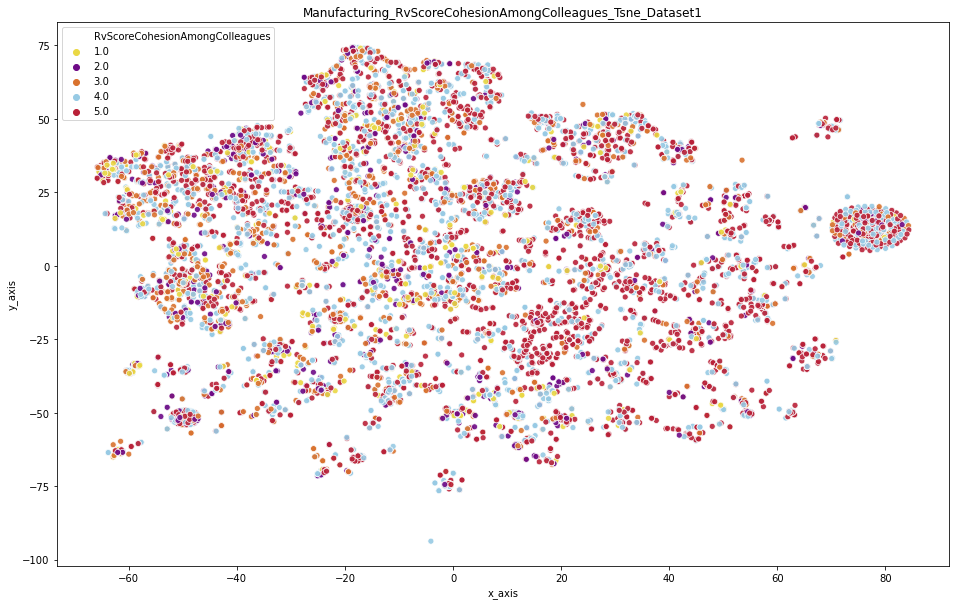

...

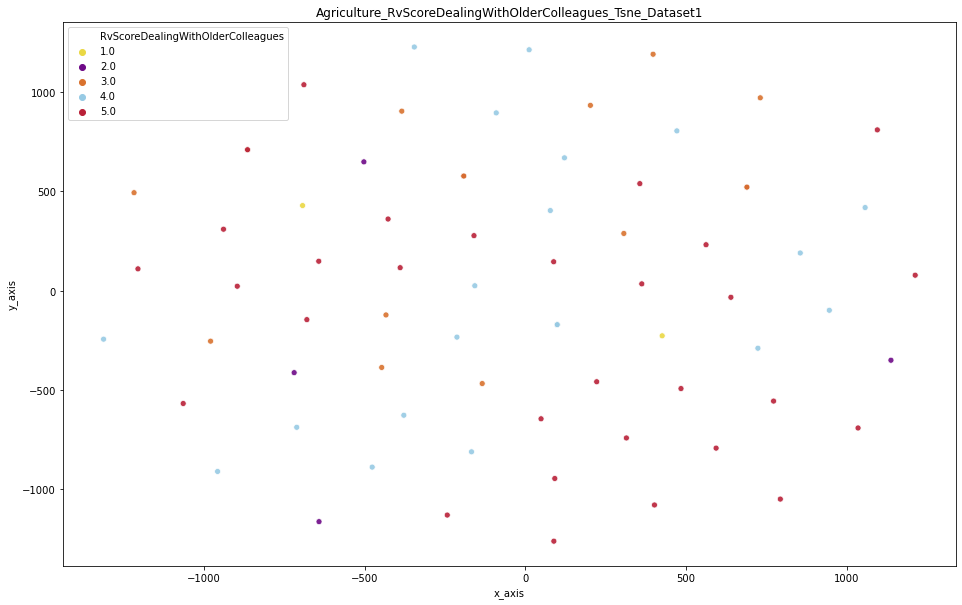

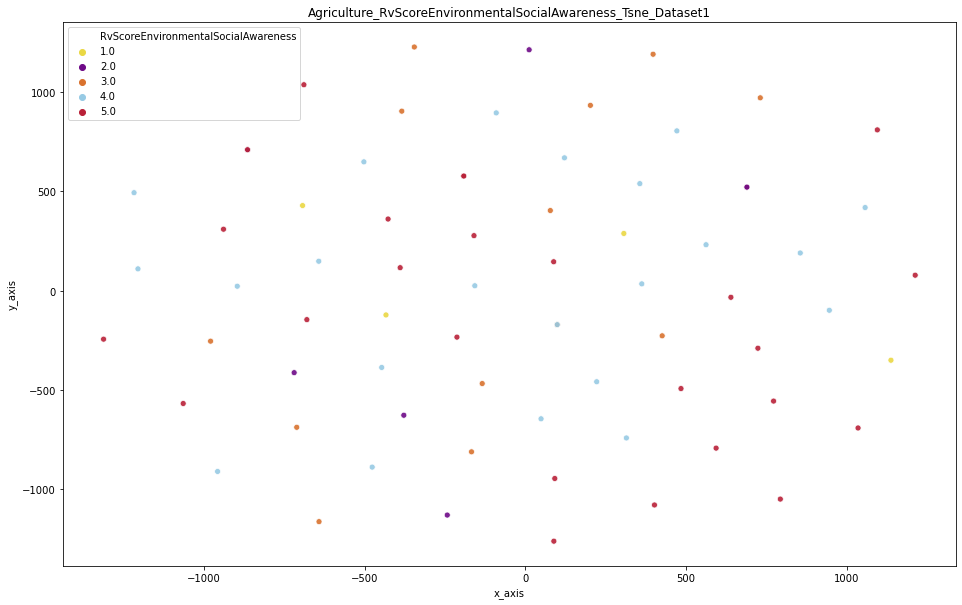

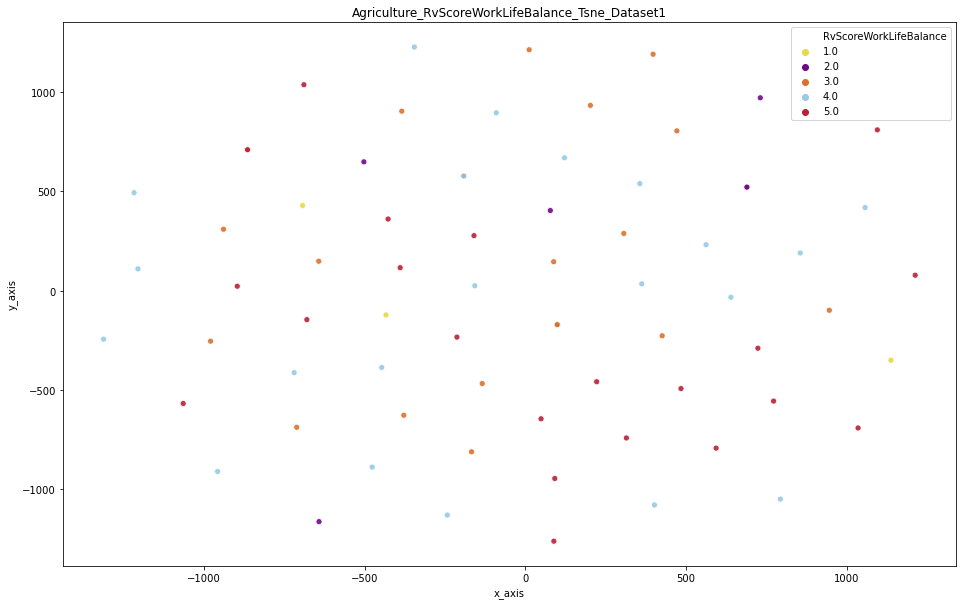

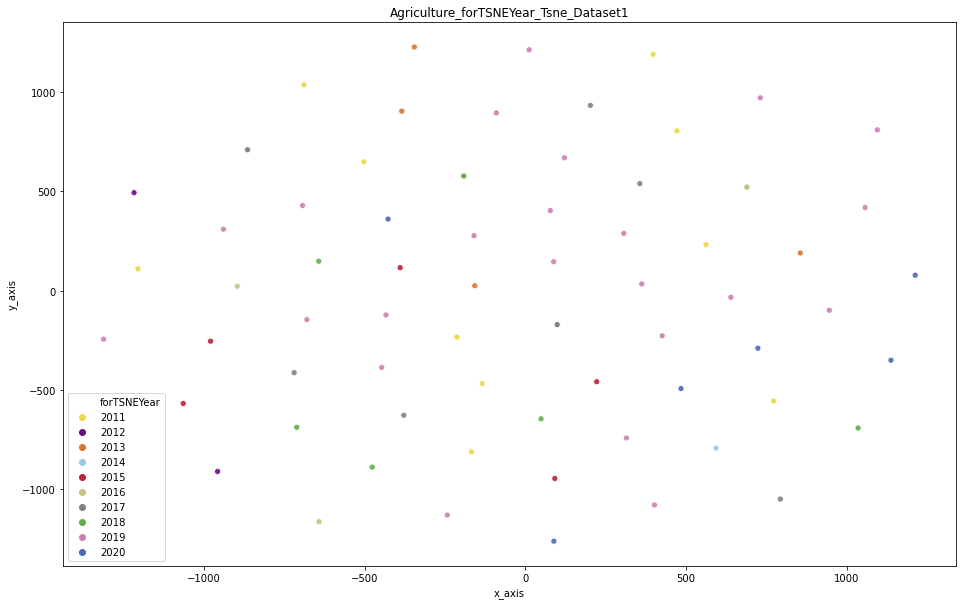

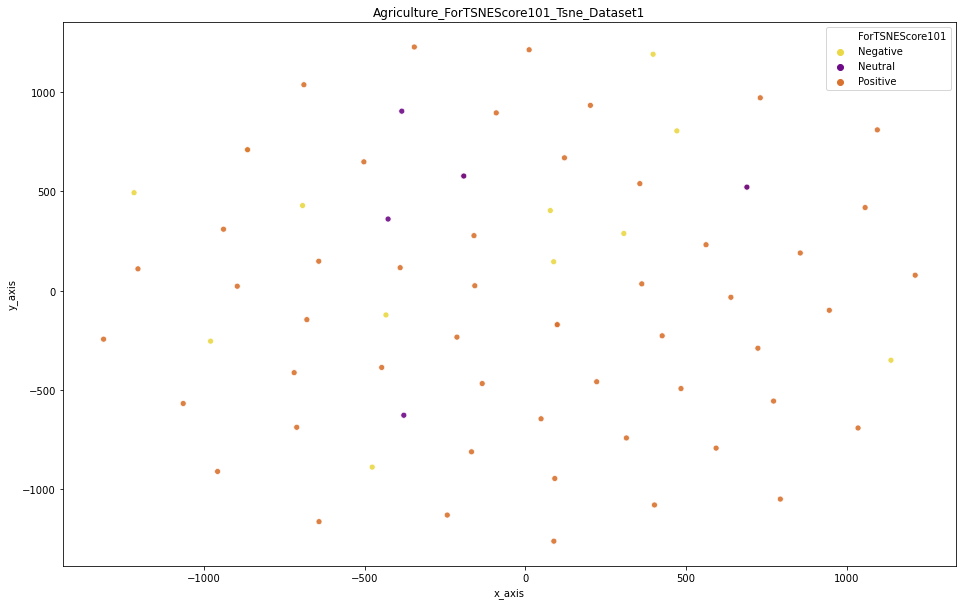

In [8]:
from sklearn.manifold import TSNE
ldf=[]
Tsne_File = ['Manufacturing', 'Transportation', 'Services','Finance','Retail','Others','Construction','Agriculture']
Count = 0
df_Manufacturing = df[df['NewOrgSector'] == 'Manufacturing']
ldf.append(df_Manufacturing)
df_Transportation = df[df['NewOrgSector'] == 'Transportation & Public Utilities']
ldf.append(df_Transportation)
df_Services = df[df['NewOrgSector'] == 'Services']
ldf.append(df_Services)
df_Finance = df[df['NewOrgSector'] == 'Finance, Insurance, Real Estate']
ldf.append(df_Finance)
df_Retail  = df[df['NewOrgSector'] == 'Retail Trade']
ldf.append(df_Retail)
df_Others = df[df['NewOrgSector'] == 'Others']
ldf.append(df_Others)
df_Construction = df[df['NewOrgSector'] == 'Construction']
ldf.append(df_Construction)
df_Agriculture = df[df['NewOrgSector'] == 'Agriculture, Forestry, Fishing']
ldf.append(df_Agriculture)

for df_sector in ldf :
    df_sector1 = df_sector[['topic0', 'topic1', 'topic2', 'topic3', 'topic4', 'topic5','topic6','topic7',
                                      'topic8','topic9','topic10','topic11','topic12','topic13','topic14','topic15','topic16',
                                      'topic17']]
    for i in range(0, 18):
        col_name = 'topic' + str(i)
        df_sector1[col_name] = df_sector1[col_name].astype(float)
    
#df_Manufacturing1.dtypes
    result_df_sector = df_sector1.to_numpy() 
    print('Tsne_Model for '+ Tsne_File[Count] )
# Tsne model fitting
    tsne_model = TSNE(n_components=2, perplexity=70, learning_rate=600, n_iter=2000, verbose=1, random_state=7, angle=.5,
                  init='pca')
# 18-D -> 2-D #22-D -> 2-D
    tsne_Org_Sector = tsne_model.fit_transform(result_df_sector) # result is document-topic matrix from LDA

    tsne_Org_Sector_df = pd.DataFrame(tsne_Org_Sector)
    df_sector_copy = df_sector

    df_sector_copy.reset_index(inplace = True)
    df_sector_copy['x_axis']=tsne_Org_Sector_df[0]
    df_sector_copy['y_axis']=tsne_Org_Sector_df[1]
#df_Manufacturing_copy

# TSNE PLOTS for all features
    
    features = ['NewRverCategory','PreviousVsCurrentFlag','RverRecom','RvScoreWorkAtmosphere','RvScoreCohesionAmongColleagues',
                'RvScoreEqualRights','RvScoreDealingWithOlderColleagues','RvScoreEnvironmentalSocialAwareness',
                'RvScoreWorkLifeBalance','forTSNEYear','ForTSNEScore101'#,'tsne_state'
               ]
    
    for metadata in features:
        plt.figure(figsize=(16,10))
        colors = ["#ead844", "#6e0a87", "#d9722e", "#97cae4", "#b92138", "#c3c484", "#808281", "#61ae4b", "#cf7eb2", "#476bb5", "#dd8969", "#481191", "#dcab35", "#92008c", "#e6f55e", "#7d1a13", "#93b841", "#6e3715", "#d0322a", "#2b3919"]
        colors2 = colors[:df_sector_copy[metadata].nunique()]
        sns.scatterplot(
            x='x_axis', y='y_axis',
            hue=df_sector_copy[metadata],
            data=df_sector_copy[['x_axis','y_axis']],
            legend="full",
            alpha=0.9,
            palette= sns.color_palette(colors2),
            hue_order = sorted(df_sector_copy[metadata].unique())    
        )
        plt.title(Tsne_File[Count]+ '_' + metadata + '_Tsne_Dataset1', fontdict=None, loc='center')
#        plt.savefig(Tsne_File[Count]+ '_' + metadata + '_Tsne_Dataset1.pdf')
    Count = Count + 1